# Analysis on X_int of visiumHD CRC P5

## Import libraries

In [1]:
import spatialdata as sd
import squidpy as sq

/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/importlib/__init__.py:126: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  return _bootstrap._gcd_import(name[level:], package, level)
/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution


In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd

In [3]:
from sklearn.decomposition import PCA

In [4]:
import rapids_singlecell as rsc

In [5]:
import os, sys
import pickle
import torch
from scipy.sparse import issparse
import gc
from pprint import pprint
from tqdm.autonotebook import tqdm

In [6]:
import mintflow
import mintflow.interface.perturbation.module_gen_micsizefactor
import mintflow.interface.perturbation.module_gen_stdata

In [66]:
from collections import OrderedDict

## Paths

In [7]:
path_output_files = "/nfs/team361/ms83/data/CRC/visiumHD_mintflow/Outputs_nb1_P5_annealing/"

## Load the data with embeddings

In [8]:
adata = sc.read_h5ad(path_output_files + 'adata_P5_mic_score.h5ad')

In [9]:
adata

AnnData object with n_obs × n_vars = 252242 × 7000
    obs: 'tissue', 'X', 'Y', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'Periphery', 'UnsupervisedL1', 'UnsupervisedL2', 'MacrophageSubtype', 'GobletSubcluster', 'patient', 'patient_id', 'inflow_CT', 'inflow_BatchID', 'TLS_general', 'MintFlow_microenv_score', 'leiden_int', 'leiden_mic'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'DeconvolutionLabel2_centrality_scores', 'DeconvolutionLabel2_colors', 'DeconvolutionLabel2_nhood_enrichment', 'X_PCA_barint', 'X_PCA_barmic', 'X_PCA_int', 'X_PCA_mic', 'X_UMAP_barint', 'X_UMAP_barmic', 'X_UMAP_int', 'X_UMAP_mic', 'inflow_CT_colors', 'leiden_int', 'leiden_int_colors', 'leiden_mic', 'leiden_mic_colors', 'log1p', 'neighbors', 'neighbors_barint', 'neighbors_barmic', 'neighbors_int', 'neighbors_mic', 'pca', 'spatial', 'spatial_neighbors', 'umap'
    obsm: 'MintFlow_S_in', 'MintFlow_S_out', 'MintFlow_Xbar_int', 'MintFlow_Xbar_mic', 'MintFlow_Xint', 'MintFlow_Xint

/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


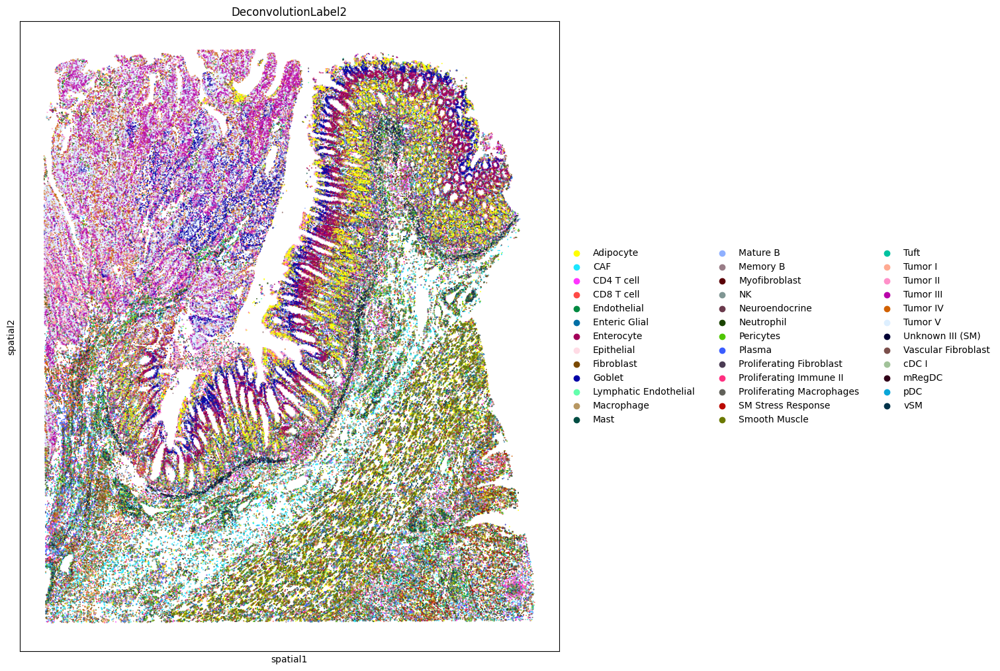

In [10]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=[
        "DeconvolutionLabel2",
    ],
    wspace=0.4,
    size=0.2,
    figsize=(15, 15)
)

/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


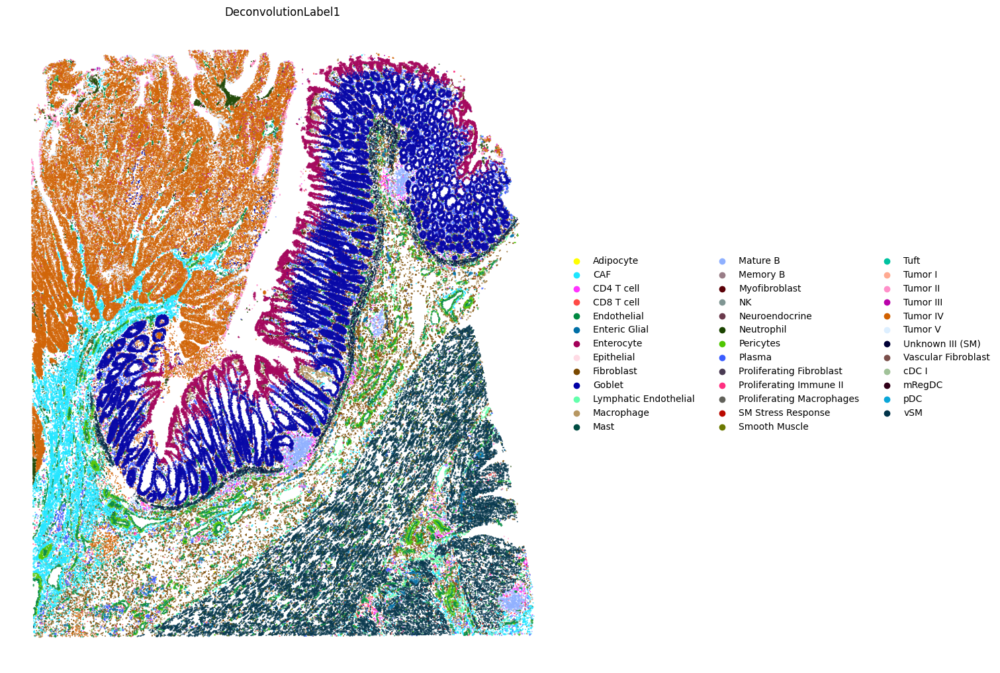

In [65]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=[
        "DeconvolutionLabel1",
    ],
    wspace=0.4,
    size=0.2,
    figsize=(15, 15),
    frameon=False
)

In [12]:
adata.obs.DeconvolutionLabel1.value_counts()

DeconvolutionLabel1
Tumor IV                     58997
Goblet                       55038
vSM                          39600
CAF                          15664
Enterocyte                   14758
Endothelial                  12190
Fibroblast                   11931
Tumor V                       7751
Pericytes                     5290
Plasma                        5137
Macrophage                    4644
Myofibroblast                 2619
Mature B                      2345
Enteric Glial                 2286
Tumor II                      1983
Neutrophil                    1784
Unknown III (SM)              1771
Lymphatic Endothelial         1699
Tumor III                     1185
Smooth Muscle                 1151
CD4 T cell                     936
CD8 T cell                     812
Mast                           583
Proliferating Immune II        564
Proliferating Macrophages      450
cDC I                          172
Neuroendocrine                 163
Epithelial                     161


/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


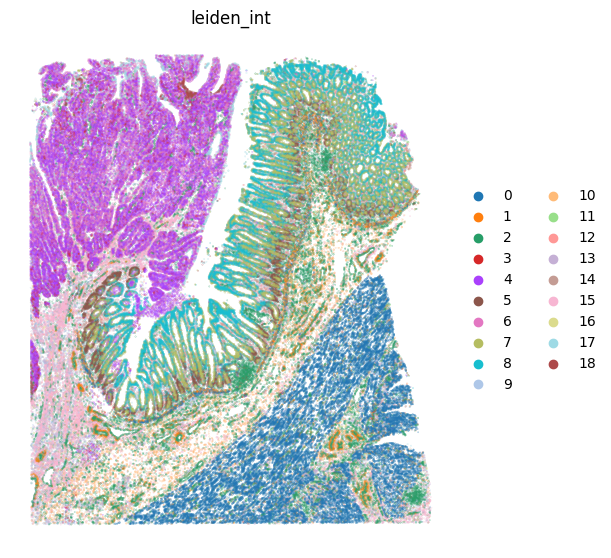

In [13]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=[
        "leiden_int",
    ],
    wspace=0.4,
    size=0.02,
    figsize=(6, 6),
    frameon=False
)

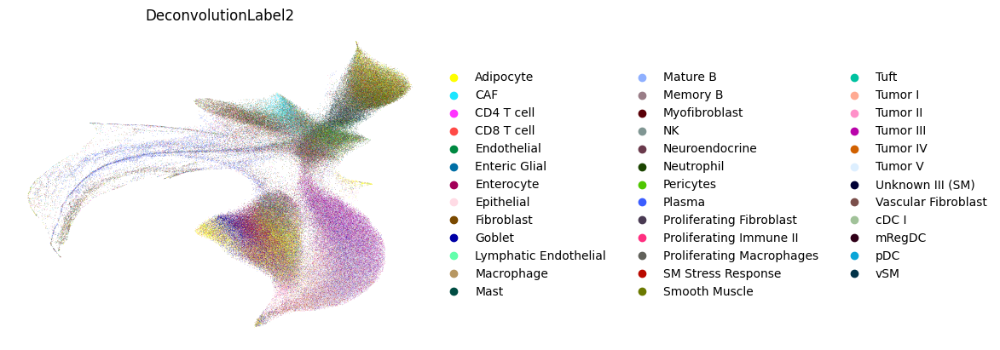

In [15]:
sc.pl.embedding(
    adata,
    color='DeconvolutionLabel2',
    basis="X_UMAP_int",
    frameon=False
)

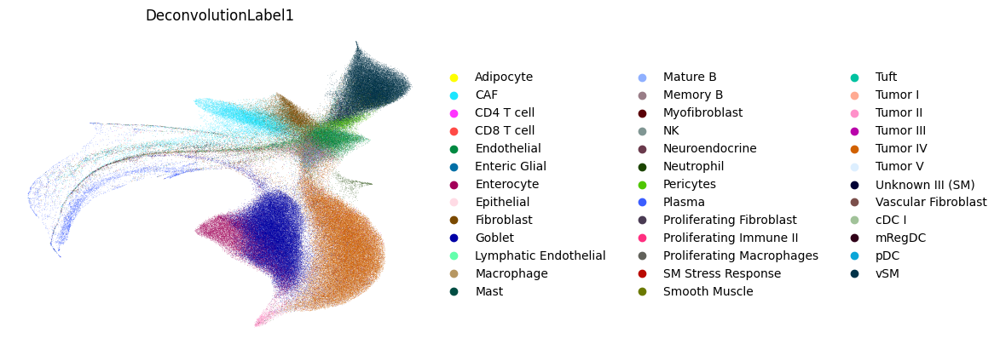

In [64]:
sc.pl.embedding(
    adata,
    color='DeconvolutionLabel1',
    basis="X_UMAP_int",
    frameon=False
)

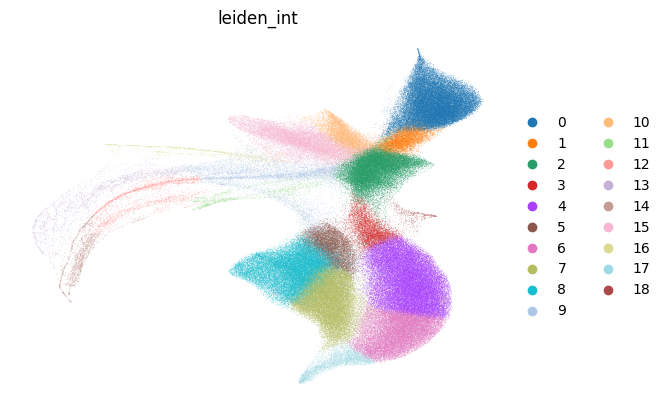

In [16]:
sc.pl.embedding(
    adata,
    color='leiden_int',
    basis="X_UMAP_int",
    frameon=False
)

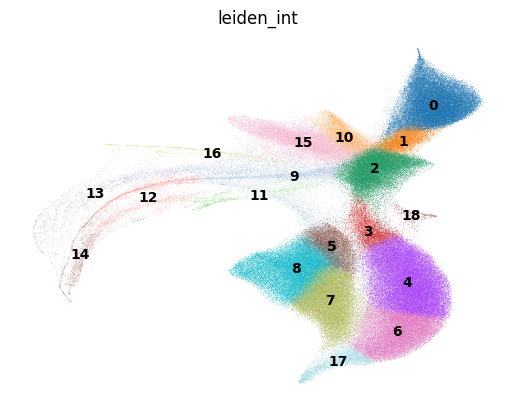

In [53]:
sc.pl.embedding(
    adata,
    color='leiden_int',
    basis="X_UMAP_int",
    frameon=False,
    legend_loc='on data'
)

/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


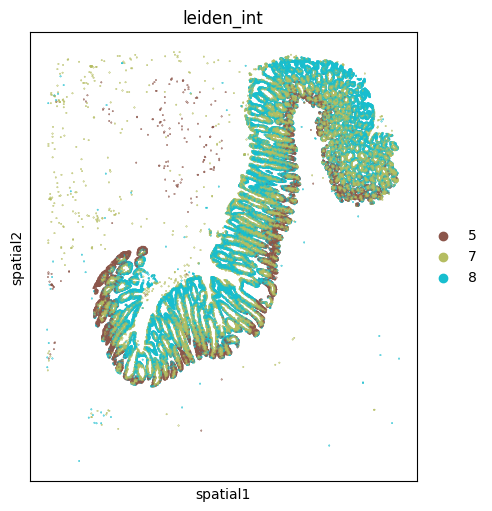

In [54]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=["leiden_int"],
    groups=["8", "5", "7"],
    wspace=0.4,
    size=0.2,
    figsize=(5, 5)
)

In [56]:
adata.layers['mintflow_int'] = adata.obsm["MintFlow_Xint"]

In [57]:
# Now run the differential expression analysis using these counts
sc.tl.rank_genes_groups(
    adata,
    groupby="leiden_int",
    method="wilcoxon",
    layer="mintflow_int",
    use_raw=False,
    key_added="de_leiden_int__mintflow_int"
)

/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/software/cellgen/team361/ms83/envs/env_Dec11th_

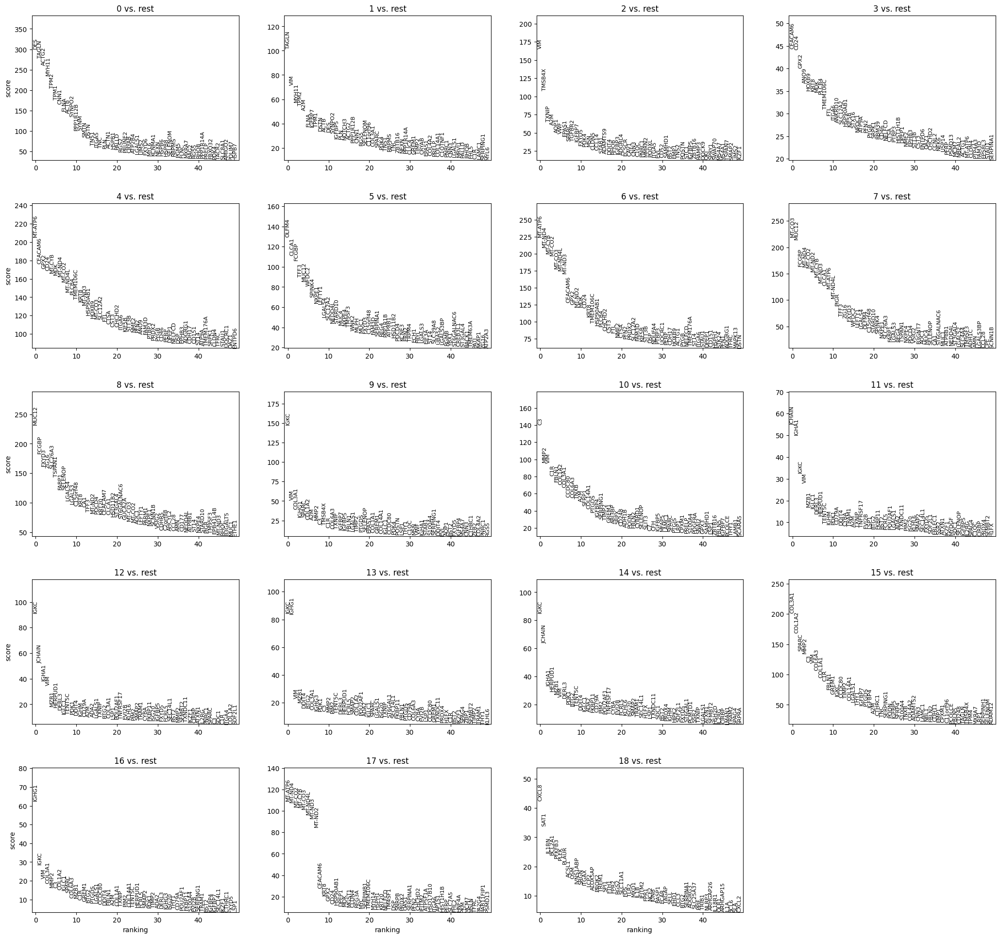

In [58]:
sc.pl.rank_genes_groups(adata, key="de_leiden_int__mintflow_int", n_genes=50, sharey=False)

In [59]:
# Optionally, view the top genes per cluster
result = adata.uns['de_leiden_int__mintflow_int']
groups = result['names'].dtype.names  # cluster names
for group in groups:
    print(f"Top genes in {group}:")
    print(result['names'][group][:50])

Top genes in 0:
['DES' 'TAGLN' 'ACTG2' 'MYH11' 'TPM2' 'TPM1' 'CNN1' 'FLNA' 'ACTB' 'SYNPO2'
 'PPP1R12B' 'SYNM' 'SMTN' 'DSTN' 'TNS1' 'ITGA5' 'TNC' 'PLN' 'ACTN1'
 'HSPB1' 'PALLD' 'RGS2' 'PRUNE2' 'CRYAB' 'ATP2B4' 'LGALS1' 'LIMS2' 'FXYD6'
 'MYL6' 'KCNMA1' 'NEXN' 'HSPB6' 'HSPB8' 'SELENOM' 'RBPMS' 'PGM5' 'FLNC'
 'MXRA7' 'BAG2' 'RGS5' 'RHOB' 'PPP1R14A' 'PRELP' 'FBXO32' 'PDK4' 'TACR2'
 'SLC8A1' 'AMIGO2' 'PDLIM7' 'HSPB7']
Top genes in 1:
['TAGLN' 'VIM' 'MYH11' 'TPM2' 'A2M' 'FLNA' 'IGFBP7' 'TPM1' 'DSTN' 'ACTB'
 'DES' 'SYNPO2' 'IGFBP5' 'PLN' 'NOTCH3' 'ACTG2' 'PPP1R12B' 'CNN1' 'RGS5'
 'SELENOM' 'C11orf96' 'COL3A1' 'SPARC' 'PDK4' 'TNS1' 'RBPMS' 'TNC'
 'ZBTB16' 'NEXN' 'PPP1R14A' 'CLIC4' 'GREM1' 'TIMP2' 'CRYAB' 'EPAS1'
 'COL4A2' 'PRELP' 'COL14A1' 'C1QTNF1' 'PNRC1' 'CNN3' 'LGALS1' 'MRVI1'
 'PALLD' 'RHOB' 'FHL5' 'C1R' 'LAMC1' 'SERPING1' 'MYL6']
Top genes in 2:
['VIM' 'TMSB4X' 'TXNIP' 'A2M' 'AQP1' 'VWF' 'EPAS1' 'SPARC' 'TGFBR2'
 'IGFBP7' 'FXYD5' 'PDK4' 'MSN' 'CLDN5' 'CCL14' 'STAB1' 'ADAMTS9' 'DDIT4'
 'RH

### Characterizing intestinal villus cell types

categories: 0, 1, 2, etc.
var_group_labels: 5, 7, 8


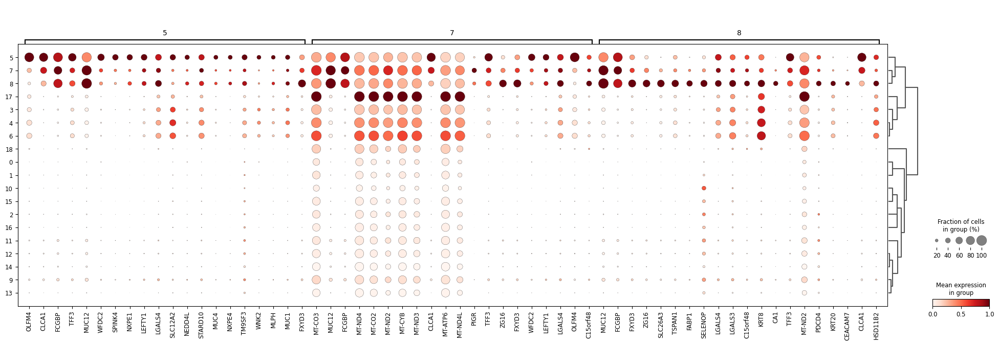

In [63]:
sc.pl.rank_genes_groups_dotplot(
    adata,
    key="de_leiden_int__mintflow_int",
    groups=["5", "7", "8"],
    groupby="leiden_int",
    layer="mintflow_int",
    n_genes=20,
    standard_scale="var",
)

In [67]:
# goblet/secretory phenotype
genes_cl5 = [
    "CLCA1",
    "FCGBP",
    "TFF3",
    "OLFM4",
    "REG4",
    "SPINK4",
    "WFDC2",
    "MUC12",
    "MUC4",
    "ZG16",
]

In [68]:
# mitocondrial stress, secretory, metabolic activation
genes_cl7 = [
    "MT-CO3",
    "MT-ND4",
    "MT-CYB",
    "CLCA1",
    "FCGBP",
    "TFF3",
    "PIGR",
    "CCL28",
    "FABP1",
    "SLC26A3",
]

In [69]:
# epithelial, absorptive, metabolic (enterocytes)
genes_cl8 = [
    "FABP1",
    "SLC26A3",
    "CA1",
    "KRT20",
    "CDHR5",
    "CEACAM7",
    "GUCA2A",
    "SCNN1B",
    "MUC12",
    "FXYD3",
]

In [70]:
genes_5_7_8 = list(OrderedDict.fromkeys(
    genes_cl5 + genes_cl7 + genes_cl8
))

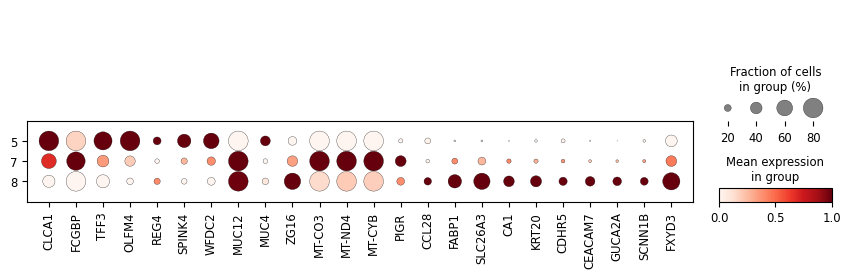

In [71]:
clusters = ["5", "7", "8"]

sc.pl.dotplot(
    adata[adata.obs["leiden_int"].isin(clusters)],
    var_names=genes_5_7_8,
    groupby="leiden_int",
    layer="mintflow_int",
    standard_scale="var",
    dot_max=0.8,
)

In [80]:
mapping = {
    "5": "5 - Secretory goblet-like",
    "7": "7 - Secretory stressed",
    "8": "8 - Absorptive enterocytes-like",
}

adata.obs["leiden_int_named"] = adata.obs["leiden_int"].astype(str)
adata.obs["leiden_int_named"] = adata.obs["leiden_int_named"].replace(mapping)
adata.obs["leiden_int_named"] = adata.obs["leiden_int_named"].astype("category")

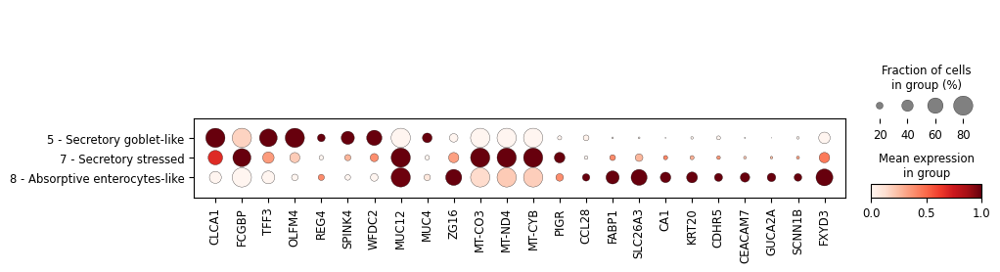

In [81]:
clusters = ["5 - Secretory goblet-like", "7 - Secretory stressed", "8 - Absorptive enterocytes-like"]

sc.pl.dotplot(
    adata[adata.obs["leiden_int_named"].isin(clusters)],
    var_names=genes_5_7_8,
    groupby="leiden_int_named",
    layer="mintflow_int",
    standard_scale="var",
    dot_max=0.8,
)

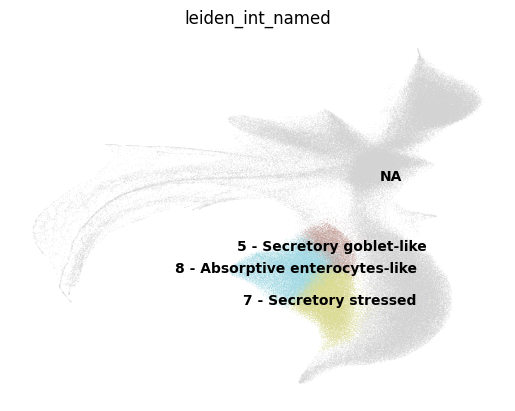

In [89]:
sc.pl.embedding(
    adata,
    color='leiden_int_named',
    groups=["5 - Secretory goblet-like", "7 - Secretory stressed", "8 - Absorptive enterocytes-like"],
    basis="X_UMAP_int",
    frameon=False,
    legend_loc='on data'
)

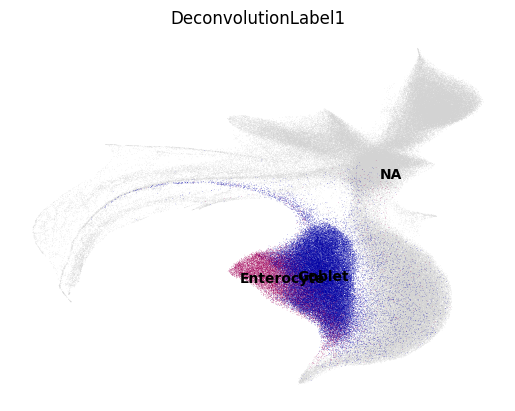

In [87]:
sc.pl.embedding(
    adata,
    color='DeconvolutionLabel1',
    groups=['Enterocyte', 'Goblet'],
    basis="X_UMAP_int",
    frameon=False,
    legend_loc='on data'
)

### Characterizing endothelium

categories: 0, 1, 2, etc.
var_group_labels: 1, 2


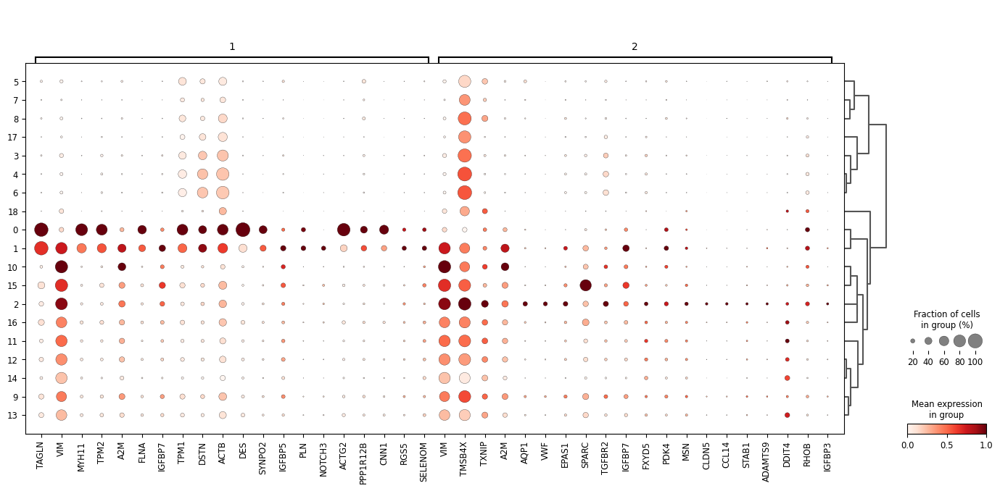

In [90]:
sc.pl.rank_genes_groups_dotplot(
    adata,
    key="de_leiden_int__mintflow_int",
    groups=["1", "2"],
    groupby="leiden_int",
    layer="mintflow_int",
    n_genes=20,
    standard_scale="var",
)

In [91]:
mapping = {
    "5": "5 - Secretory goblet-like",
    "7": "7 - Secretory stressed",
    "8": "8 - Absorptive enterocytes-like",
    "1": "1 - Pericytes/smooth_muscle-like",
    "2": "2 - Endothelial (activated)",
}

adata.obs["leiden_int_named"] = adata.obs["leiden_int"].astype(str)
adata.obs["leiden_int_named"] = adata.obs["leiden_int_named"].replace(mapping)
adata.obs["leiden_int_named"] = adata.obs["leiden_int_named"].astype("category")

In [101]:
genes_cl1 = [
    # Contractile / cytoskeleton
    "TAGLN", "MYH11", "ACTG2", "CNN1", "CNN3", "TPM1", "TPM2",
    "DES", "MYL6",

    # Pericyte markers
    "RGS5", "NOTCH3",

    # ECM / matrix interaction
    "SPARC", "TNC", "TIMP2",
]

In [110]:
genes_cl2 = ['VWF', 'CLDN5', 'ECSCR', 'PODXL', 'AQP1', 'TXNIP', 'EPAS1', 'DDIT4', 'IGFBP7', 'STAB1', 'ADGRL4', 'CAV1']

In [111]:
genes_1_2 = list(OrderedDict.fromkeys(genes_cl1 + genes_cl2))

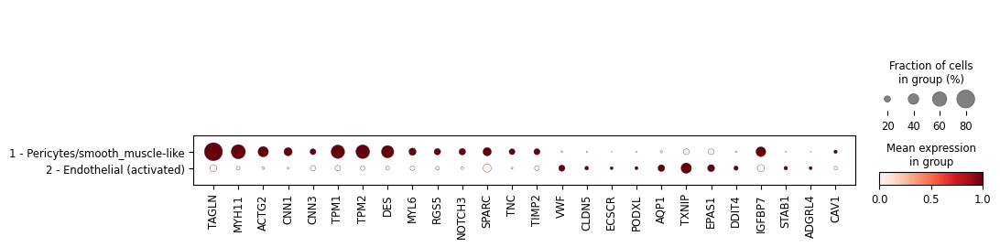

In [112]:
clusters_1_2 = [
    "1 - Pericytes/smooth_muscle-like",
    "2 - Endothelial (activated)",
]

sc.pl.dotplot(
    adata[adata.obs["leiden_int_named"].isin(clusters_1_2)],
    var_names=genes_1_2,              
    groupby="leiden_int_named",
    layer="mintflow_int",
    standard_scale="var",
    dot_max=0.8,
)

In [273]:
adata.write_h5ad((path_output_files + 'adata_P5_mic_score_int_de.h5ad'))

### Vasculature 

In [230]:
adata_vasc = adata[adata.obs["DeconvolutionLabel1"].isin(
    ["vSM", 'Lymphatic Endothelial', 'Pericytes', 'Endothelial']
)].copy()

adata_vasc

AnnData object with n_obs × n_vars = 58779 × 7000
    obs: 'tissue', 'X', 'Y', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'Periphery', 'UnsupervisedL1', 'UnsupervisedL2', 'MacrophageSubtype', 'GobletSubcluster', 'patient', 'patient_id', 'inflow_CT', 'inflow_BatchID', 'TLS_general', 'MintFlow_microenv_score', 'leiden_int', 'leiden_mic', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'leiden_int_named'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'DeconvolutionLabel2_centrality_scores', 'DeconvolutionLabel2_colors', 'DeconvolutionLabel2_nhood_enrichment', 'X_PCA_barint', 'X_PCA_b

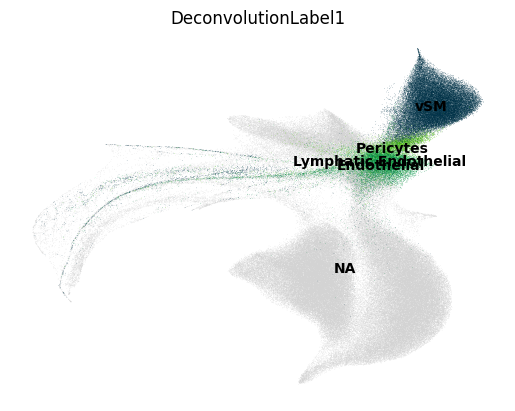

In [231]:
sc.pl.embedding(
    adata,
    color='DeconvolutionLabel1',
    groups=["vSM", 'Lymphatic Endothelial', 'Pericytes', 'Endothelial'],
    basis="X_UMAP_int",
    frameon=False,
    legend_loc='on data'
)

In [232]:
sc.tl.pca(adata_vasc)
rsc.pp.neighbors(adata_vasc)
rsc.tl.umap(adata_vasc)

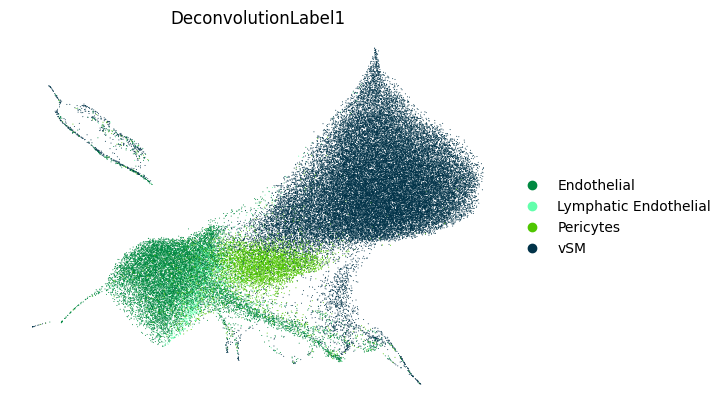

In [233]:
sc.pl.umap(adata_vasc, color='DeconvolutionLabel1', frameon=False)

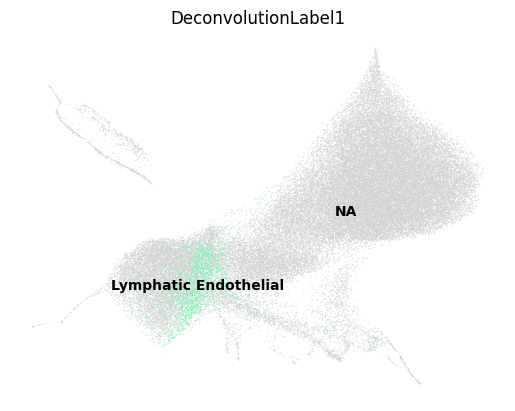

In [234]:
sc.pl.umap(adata_vasc, 
           color='DeconvolutionLabel1', 
           groups=['Lymphatic Endothelial'],
           frameon=False,
           legend_loc='on data')

In [241]:
del adata_vasc.uns['leiden_int_vasc_colors']

In [235]:
del adata_vasc.uns['leiden_int_named_colors']

In [242]:
sc.tl.leiden(adata_vasc, 
             flavor="igraph", 
             n_iterations=2,
             resolution=0.8,
             key_added="leiden_int_vasc"
            )

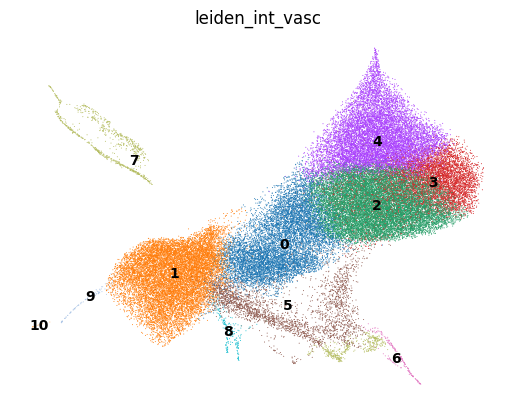

In [243]:
sc.pl.umap(adata_vasc, color='leiden_int_vasc', frameon=False, legend_loc='on data')

In [244]:
# Now run the differential expression analysis using these counts
sc.tl.rank_genes_groups(
    adata_vasc,
    groupby="leiden_int_vasc",
    method="wilcoxon",
    layer="mintflow_int",
    use_raw=False,
    key_added="de_leiden_int_mintflow_vasc"
)

/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/software/cellgen/team361/ms83/envs/env_Dec11th_

In [245]:
# Optionally, view the top genes per cluster
result = adata_vasc.uns['de_leiden_int_mintflow_vasc']
groups = result['names'].dtype.names  # cluster names
for group in groups:
    print(f"Top genes in {group}:")
    print(result['names'][group][:50])

Top genes in 0:
['VIM' 'TMSB4X' 'NOTCH3' 'A2M' 'MT-CO3' 'COL3A1' 'IGFBP7' 'SPARC'
 'C11orf96' 'IGFBP5' 'COL14A1' 'MT-ATP6' 'COL1A2' 'C1QTNF1' 'C3' 'RGS5'
 'GREM1' 'C1R' 'MT-CYB' 'FHL5' 'S100A4' 'PLN' 'FBLN1' 'ID4' 'SELENOM'
 'SLIT3' 'NTRK3' 'SERPING1' 'TIMP2' 'NR2F2' 'ZBTB16' 'SLC7A2' 'ADCY3'
 'DSTN' 'MMP2' 'AXL' 'SDC2' 'SAMHD1' 'MRVI1' 'ZEB2' 'PNRC1' 'LAMC1' 'UTRN'
 'SELENOP' 'GPX3' 'NET1' 'CCDC80' 'PARM1' 'CPE' 'ENAH']
Top genes in 1:
['VIM' 'TMSB4X' 'AQP1' 'VWF' 'EPAS1' 'TGFBR2' 'NPDC1' 'SPARC' 'TXNIP'
 'A2M' 'CCL14' 'CLDN5' 'EMP1' 'TM4SF1' 'FXYD5' 'DOCK9' 'PODXL' 'ADAMTS9'
 'IGFBP3' 'ECSCR' 'ADGRL4' 'DDIT4' 'MMRN2' 'IGFBP7' 'MSN' 'TSPAN7' 'KLF6'
 'SPRY1' 'SULF2' 'POSTN' 'NFIB' 'BMPR2' 'ACTG1' 'ITGA6' 'STC1' 'CNN3'
 'RHOC' 'HIPK3' 'SWAP70' 'RAMP3' 'PCDH1' 'CMIP' 'TNS2' 'PDCD4' 'UBA52'
 'CCNL2' 'NPC2' 'CFLAR' 'SELENON' 'FBLN2']
Top genes in 2:
['ACTG2' 'ACTB' 'CNN1' 'TPM1' 'FLNA' 'TPM2' 'MYH11' 'TAGLN' 'SMTN' 'DES'
 'DSTN' 'HSPB1' 'TNC' 'PPP1R12B' 'PRUNE2' 'ACTN1' 'ITGA5' 'SYNM' 'RGS

categories: 0, 1, 2, etc.
var_group_labels: 0, 1, 2, etc.


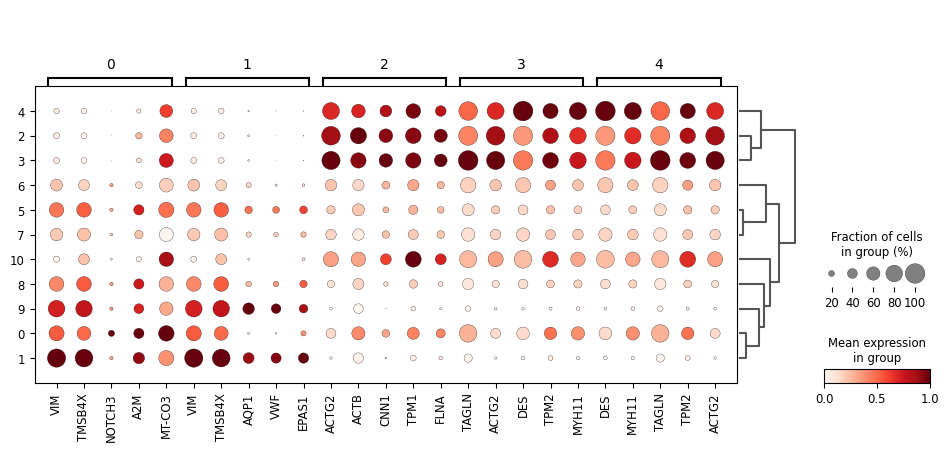

In [247]:
sc.pl.rank_genes_groups_dotplot(
    adata_vasc,
    key="de_leiden_int_mintflow_vasc",
    groups=["0", "1", "2", "3", "4"],
    groupby="leiden_int_vasc",
    layer="mintflow_int",
    n_genes=5,
    standard_scale="var",
)

In [252]:
adata_0 = adata_vasc[adata_vasc.obs["leiden_int_vasc"] == "0"].copy()
sc.pp.neighbors(adata_0, n_neighbors=15, n_pcs=30)
sc.tl.leiden(adata_0, resolution=0.3, key_added="leiden_0_sub")

/tmp/ipykernel_2993275/1948107505.py:3: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_0, resolution=0.3, key_added="leiden_0_sub")


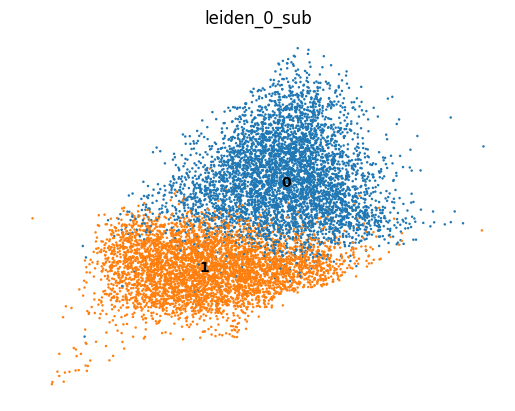

In [253]:
sc.pl.umap(adata_0, color='leiden_0_sub', frameon=False, legend_loc='on data')

In [254]:
adata_vasc.obs["leiden_refined"] = adata_vasc.obs["leiden_int_vasc"].astype(str)

adata_vasc.obs.loc[
    adata_0.obs_names, "leiden_refined"
] = "0_" + adata_0.obs["leiden_0_sub"].astype(str).values

... storing 'leiden_refined' as categorical


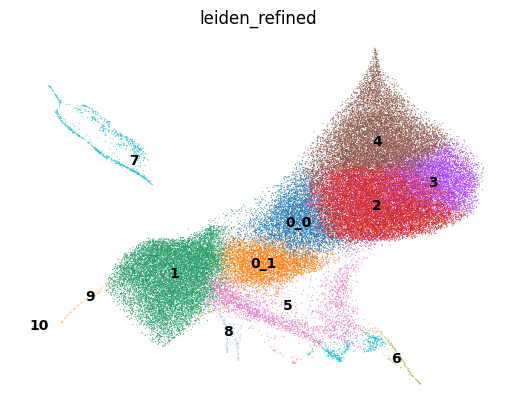

In [255]:
sc.pl.umap(adata_vasc, color='leiden_refined', frameon=False, legend_loc='on data')

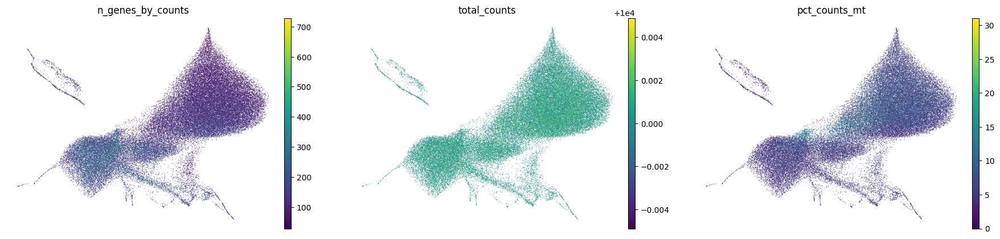

In [260]:
sc.pl.umap(adata_vasc, color=["n_genes_by_counts", "total_counts", "pct_counts_mt"], frameon=False)

In [256]:
# Now run the differential expression analysis using these counts
sc.tl.rank_genes_groups(
    adata_vasc,
    groupby="leiden_refined",
    method="wilcoxon",
    layer="mintflow_int",
    use_raw=False,
    key_added="de_leiden_refined_int_mintflow_vasc"
)

/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/software/cellgen/team361/ms83/envs/env_Dec11th_

In [257]:
# Optionally, view the top genes per cluster
result = adata_vasc.uns['de_leiden_refined_int_mintflow_vasc']
groups = result['names'].dtype.names  # cluster names
for group in groups:
    print(f"Top genes in {group}:")
    print(result['names'][group][:50])

Top genes in 0_0:
['MT-CO3' 'MT-ATP6' 'TMSB4X' 'MT-CYB' 'MT-ND4' 'GREM1' 'IGFBP5' 'C3'
 'COL3A1' 'MT-ND3' 'MT-CO2' 'VIM' 'SYNPO2' 'SELENOP' 'MYH11' 'FBLN1'
 'NBL1' 'C1R' 'MT-ND2' 'MT-ND4L' 'ADH1B' 'C7' 'GREM2' 'SELENOM' 'TIMP2'
 'COL6A3' 'FTL' 'C11orf96' 'RGS5' 'CRYAB' 'A2M' 'SAMHD1' 'PNRC1' 'MMP2'
 'SERPING1' 'PRELP' 'RSPO3' 'THBS4' 'COL1A2' 'PODN' 'PDGFRA' 'P2RY14'
 'PRKAR2B' 'VGLL3' 'LRP1' 'RGS2' 'ZEB2' 'FGF7' 'COL14A1' 'TMEM176A']
Top genes in 0_1:
['VIM' 'NOTCH3' 'IGFBP7' 'A2M' 'SPARC' 'C11orf96' 'TMSB4X' 'COL3A1'
 'C1QTNF1' 'COL14A1' 'EPAS1' 'COL1A2' 'FHL5' 'PLN' 'RGS5' 'S100A4' 'SLIT3'
 'NR2F2' 'IGFBP5' 'NTRK3' 'ADCY3' 'C1R' 'SLC7A2' 'ZBTB16' 'COL4A2' 'ID4'
 'PDK4' 'DSTN' 'LAMC1' 'NET1' 'MRVI1' 'CPE' 'GPX3' 'UTRN' 'SERPING1' 'AXL'
 'SORBS3' 'TNS2' 'ITGB5' 'PTP4A3' 'MTHFD2' 'CNN3' 'SELENOM' 'MPRIP'
 'TIMP2' 'PPP1R14A' 'SDC2' 'THY1' 'MMP2' 'CAV2']
Top genes in 1:
['VIM' 'TMSB4X' 'AQP1' 'VWF' 'EPAS1' 'TGFBR2' 'NPDC1' 'SPARC' 'TXNIP'
 'A2M' 'CCL14' 'CLDN5' 'EMP1' 'TM4SF1' 'FXYD5' 'D

categories: 0_0, 0_1, 1, etc.
var_group_labels: 0_0, 0_1, 1, etc.


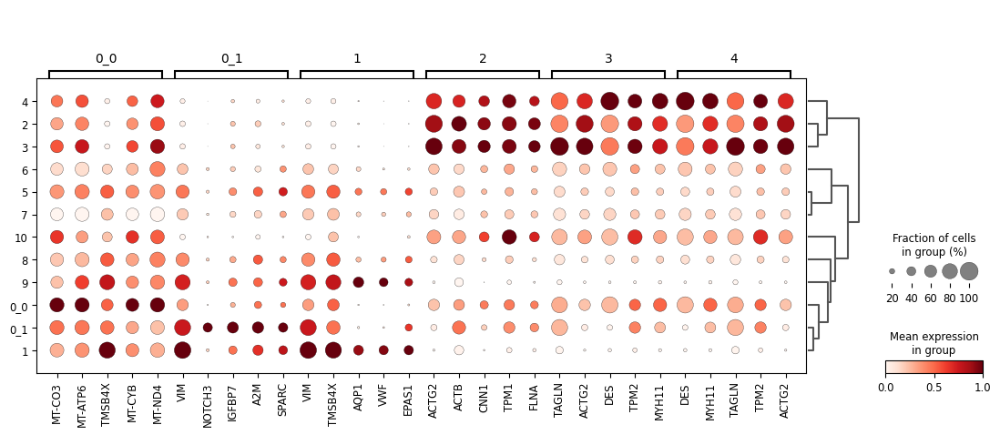

In [259]:
sc.pl.rank_genes_groups_dotplot(
    adata_vasc,
    key="de_leiden_refined_int_mintflow_vasc",
    groups=["0_0", "0_1", "1", "2", "3", "4"],
    groupby="leiden_refined",
    layer="mintflow_int",
    n_genes=5,
    standard_scale="var",
)

In [248]:
cl_2 = ['MYH11','DES','ACTG2', 'TAGLN', 'TPM2', 'CNN1', 'TPM1', 'DES', 'ACTB', 'FLNA'] #vascular smooth muscle cells 

In [249]:
cl_3 = ['MYH11','DES','ACTG2', 'TAGLN', 'TPM2', 'CNN1', 'TPM1', 'DES', 'ACTB', 'FLNA'] #vascular smooth muscle cells 

In [250]:
cl_4 = ['MYH11','DES','ACTG2', 'TAGLN', 'TPM2', 'CNN1', 'TPM1', 'DES', 'ACTB', 'FLNA'] #vascular smooth muscle cells 

In [251]:
cl_1 = ['VWF', 'CLDN5', 'ADGRL4', 'ECSCR', 'PODXL', 'EPAS1', 'AQP1'] #endothelial

In [261]:
cl_0_1 = ['NOTCH3', 'RGS5', 'PLN', 'SERPING1', 'THY1', 'NR2F2', 'EPAS1'] #pericytes

In [263]:
genes_0_4 = list(OrderedDict.fromkeys(cl_0_1 + cl_1 + cl_2 + cl_3 + cl_4))

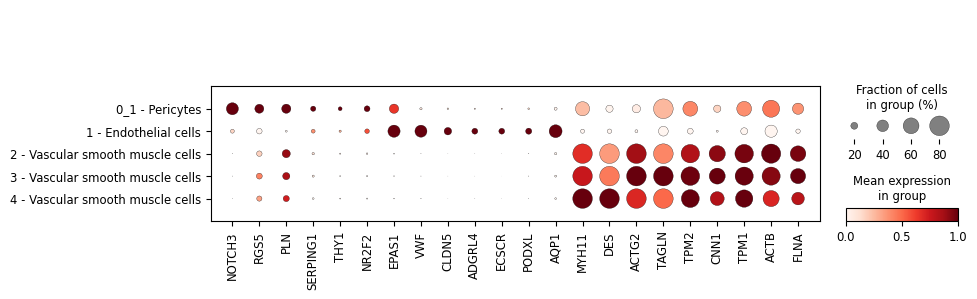

In [267]:
mapping = {
    "0_1": "0_1 - Pericytes",
    "1": "1 - Endothelial cells",
    "2": "2 - Vascular smooth muscle cells",
    "3": "3 - Vascular smooth muscle cells",
    "4": "4 - Vascular smooth muscle cells"
}

adata_vasc.obs["leiden_int_named"] = adata_vasc.obs["leiden_refined"].astype(str)
adata_vasc.obs["leiden_int_named"] = adata_vasc.obs["leiden_int_named"].replace(mapping)
adata_vasc.obs["leiden_int_named"] = adata_vasc.obs["leiden_int_named"].astype("category")

clusters = ["0_1 - Pericytes",
    "1 - Endothelial cells",
    "2 - Vascular smooth muscle cells",
    "3 - Vascular smooth muscle cells",
    "4 - Vascular smooth muscle cells",
           ]

sc.pl.dotplot(
    adata_vasc[adata_vasc.obs["leiden_int_named"].isin(clusters)],
    var_names=genes_0_4,
    groupby="leiden_int_named",
    layer="mintflow_int",
    standard_scale="var",
    dot_max=0.8,
)

In [268]:
sc.tl.score_genes(adata_vasc, cl_1, score_name='EC_score')
sc.tl.score_genes(adata_vasc, cl_2, score_name='VSMC_score')
sc.tl.score_genes(adata_vasc, cl_0_1, score_name='Pericyte_score')

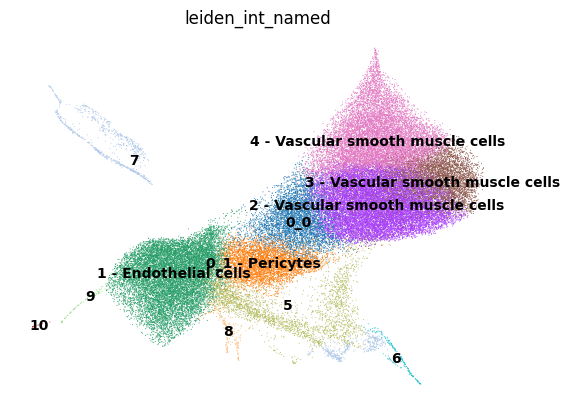

In [294]:
sc.pl.umap(adata_vasc, color='leiden_int_named', frameon=False, legend_loc='on data')

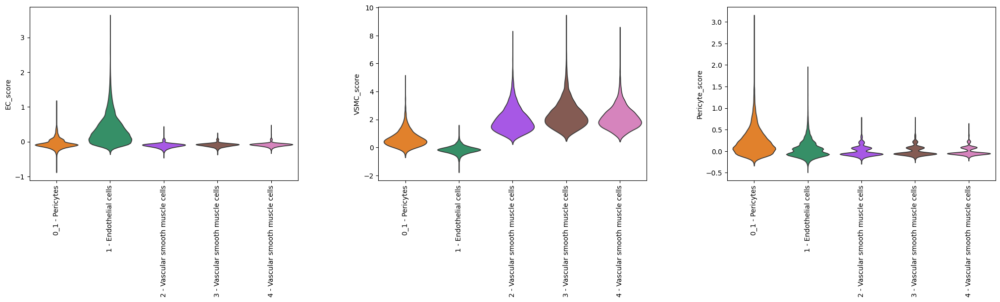

In [295]:
sc.pl.violin(
    adata_vasc[adata_vasc.obs["leiden_int_named"].isin(clusters)],
    ['EC_score','VSMC_score','Pericyte_score'],
    groupby='leiden_int_named',
    stripplot=False,
    rotation=90
)


In [296]:
adata_vasc.write_h5ad(path_output_files + 'adata_vasc_P5_mic_score_int_de.h5ad')

In [284]:
adata_vasc

AnnData object with n_obs × n_vars = 58779 × 7000
    obs: 'tissue', 'X', 'Y', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'Periphery', 'UnsupervisedL1', 'UnsupervisedL2', 'MacrophageSubtype', 'GobletSubcluster', 'patient', 'patient_id', 'inflow_CT', 'inflow_BatchID', 'TLS_general', 'MintFlow_microenv_score', 'leiden_int', 'leiden_mic', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'leiden_int_named', 'leiden_int_vasc', 'leiden_refined', 'EC_score', 'VSMC_score', 'Pericyte_score', 'Pericyte_score_2'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'DeconvolutionLabel2_centrality_sc